In [ ]:
!pip install emoji==0.6.0
!pip install transformers
!pip install soynlp
!pip install pytorch_lightning
!pip install sentence_transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.0/51.0 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for emoji: filename=emoji-0.6.0-py3-none-any.whl size=49720 sha256=f23e31ff38f59ec1a341b71aae38ae5370af5d7cc4c0b38b1df145866ab29de7
  Stored in directory: /root/.cache/pip/wheels/1b/bd/d9/310c33c45a553798a714e27e3b8395d37128425442b8c78e07
Successfully built emoji
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 77.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 29.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 113.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 416.8/416.8 kB 8.

In [ ]:
import transformers
import emoji
import soynlp
import pytorch_lightning

In [ ]:
import os
import pandas as pd
import numpy as np

from pprint import pprint

import torch
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torch.optim.lr_scheduler import ExponentialLR

from pytorch_lightning import LightningModule, Trainer, seed_everything

from transformers import AutoModelForSequenceClassification, AutoTokenizer, AdamW

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

import re
import emoji
from soynlp.normalizer import repeat_normalize

In [ ]:
from utils.emotion_model import Model
from utils.infer_emotion import infer
from utils.load_data import load_dataset, idx2emoticon, emoticon2idx, convert_sentence_emotion, add_emotion

In [ ]:
from sentence_transformers import SentenceTransformer, util

from sklearn.datasets import make_classification
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
emotion_model_path = '/content/drive/MyDrive/5e-6_epoch3-val_acc0.7343_1.ckpt'
sentence_model_path = 'snunlp/KR-SBERT-V40K-klueNLI-augSTS'
emoticon_sentence_path = '/content/dataset/sentence_emoticon.txt'
idx2emoticon_path = '/content/dataset/idx2emoticon.txt'
emoticon2idx_path = '/content/dataset/emoticon2idx.txt'

In [ ]:
idx2emoticon = idx2emoticon(idx2emoticon_path)
emoticon2idx = emoticon2idx(emoticon2idx_path)

In [ ]:
emotion_model = Model.load_from_checkpoint(emotion_model_path)

Some weights of the model checkpoint at beomi/KcELECTRA-base were not used when initializing ElectraForSequenceClassification: ['discriminator_predictions.dense.weight', 'discriminator_predictions.dense_prediction.bias', 'discriminator_predictions.dense.bias', 'discriminator_predictions.dense_prediction.weight']
- This IS expected if you are initializing ElectraForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing ElectraForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of ElectraForSequenceClassification were not initialized from the model checkpoint at beomi/KcELECTRA-base and are newly initialized: ['classifier.out_proj.bias', 'classifier

In [ ]:
args = {
    'random_seed': 42,
    'pretrained_model': 'beomi/KcELECTRA-base',
    'pretrained_tokenizer': '',
    'batch_size': 32,
    'lr': 5e-6,
    'epochs': 10,
    'max_length': 25,
    'train_data_path': "/content/fold_train_5.txt",  # Train Dataset file          # fix
    'val_data_path': "/content/fold_test_5.txt",  # Validation Dataset file        # fix
    'test_mode': False,
    'optimizer': 'AdamW',
    'lr_scheduler': 'exp',
    'fp16': True,
    'tpu_cores': 0,
    'cpu_workers': os.cpu_count(),
}
emotion_model = Model(**args)
emotion_model = emotion_model.load_from_checkpoint(emotion_model_path)
emotion_model

Some weights of the model checkpoint at beomi/KcELECTRA-base were not used when initializing ElectraForSequenceClassification: ['discriminator_predictions.dense.weight', 'discriminator_predictions.dense_prediction.bias', 'discriminator_predictions.dense.bias', 'discriminator_predictions.dense_prediction.weight']
- This IS expected if you are initializing ElectraForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing ElectraForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of ElectraForSequenceClassification were not initialized from the model checkpoint at beomi/KcELECTRA-base and are newly initialized: ['classifier.out_proj.bias', 'classifier

Model(
  (clsfier): ElectraForSequenceClassification(
    (electra): ElectraModel(
      (embeddings): ElectraEmbeddings(
        (word_embeddings): Embedding(30000, 768, padding_idx=3)
        (position_embeddings): Embedding(512, 768)
        (token_type_embeddings): Embedding(2, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (encoder): ElectraEncoder(
        (layer): ModuleList(
          (0-11): 12 x ElectraLayer(
            (attention): ElectraAttention(
              (self): ElectraSelfAttention(
                (query): Linear(in_features=768, out_features=768, bias=True)
                (key): Linear(in_features=768, out_features=768, bias=True)
                (value): Linear(in_features=768, out_features=768, bias=True)
                (dropout): Dropout(p=0.1, inplace=False)
              )
              (output): ElectraSelfOutput(
                (dense): Linear(in_features=76

In [ ]:
sentence_model = SentenceTransformer(sentence_model_path)

In [ ]:
import numpy as np
from tqdm import tqdm

df = pd.read_csv("test_set.txt", sep='\t')
pred = []
for i in tqdm(df['sentence'].to_list()):
    pred.append(np.argmax(infer(emotion_model,i).detach().cpu().numpy()))
np.array(pred)
label = np.array(df['label'])
print("ACC: ", sum(label==np.array(pred)) / len(pred))

FileNotFoundError: ignored

In [ ]:
x_tokens = emotion_model.tokenizer('오늘 하루도 많이 힘들었어',return_tensors='pt')
# x_tokens = x_tokens.to('cuda')
# # torch.softmax(emotion_model(**x_tokens).logits, dim=-1)
# emotion_model.hparmas.max_length
x_tokens

{'input_ids': tensor([[ 2157, 20638,  1159,  1897,  5648]]), 'token_type_ids': tensor([[0, 0, 0, 0, 0]]), 'attention_mask': tensor([[1, 1, 1, 1, 1]])}

In [ ]:
import torch
import numpy as np
from tqdm import tqdm

class Recommend:
    def __init__(self, sentence_model, emotion_model, train_data, idx2emoticon):
        self.sen_model = sentence_model
        self.emo_model = emotion_model
        self.train_sen   = train_data[0]
        self.train_emo   = train_data[1]
        self.train_label = train_data[2]
        self.idx2emoticon = idx2emoticon
        self.train_vector = self.convert_sentence_emotion(self.sen_model, self.train_emo, self.train_sen)
        self.train_norm = np.linalg.norm(self.train_vector)
        self.rank_index = None
        self.recommendation = None
        self.input = None
        self.emotion_weight = None

    def convert_sentence_emotion(self, sen_model, emotion, sentence):
        sentence_vector = []
        sentence = sen_model.encode(sentence)
        for idx in range(len(sentence)):
            emotion_label = emotion[idx] #0,1,2,3
            distance = np.sqrt(np.mean(sentence[idx]**2))
            sentence[idx] /= distance
            tmp_vector = np.array([0, 0, 0, 0])
            tmp_vector = np.append(tmp_vector, sentence[idx])
            tmp_vector[emotion_label] = 1
            sentence_vector.append(tmp_vector)

        return np.array(sentence_vector)
    
    def infer(self, x):
        x_tokens = self.emo_model.tokenizer(x, return_tensors='pt')
        x_tokens = x_tokens.to('cuda')
        return torch.softmax(self.emo_model(**x_tokens).logits, dim=-1)

    def add_emotion(self, emotion, sentence, weight):
        sentence = self.sen_model.encode(sentence)
        distance = np.sqrt(np.sum(sentence**2))
        sentence /= distance

        emo_distance = np.sqrt(np.sum(emotion**2))
        emo_added = np.append(weight*emotion/emo_distance, sentence)
        
        return emo_added

    def recommend(self, input_sentence, emotion_weight = 1, threshold = 2, recommend_num = 5, view = True): #threshold must be located 1 to 5
        sentence_emotion = self.infer(input_sentence).cpu().detach().numpy() #emotion analysis
        input_vector = self.add_emotion(sentence_emotion, input_sentence, emotion_weight).reshape(-1,1)
        input_norm = np.linalg.norm(input_vector)
        cos_sim = np.dot(self.train_vector, input_vector).squeeze()
        self.rank_index = np.argsort(cos_sim)[::-1]

        recommendation = []
        selected = {idx : 0 for idx, _ in self.idx2emoticon.items()}
        for r in self.rank_index:
            emoticon = self.train_label[r]
            selected[emoticon] += 1
            if selected[emoticon] == threshold:
                recommendation.append(emoticon)
        self.recommendation = recommendation

        if view:
            for i in range(recommend_num):
                print('Rank{} recommended emoticon: {}'.format(i+1, self.idx2emoticon[recommendation[i]]))
            
    def sentence_analysis(self, input_sentence, emotion_weight = 1, top_num = 5): #input sentences => [List,...]
        # sentence_emotion = self.infer(input_sentence).cpu().detach().numpy() #emotion analysis
        # input_vector = self.add_emotion(sentence_emotion, input_sentence, emotion_weight).reshape(-1,1)
        # cos_sim = np.dot(self.train_vector, input_vector).squeeze()
        # rank_index = np.argsort(cos_sim)[::-1]
        self.recommend(input_sentence = input_sentence, emotion_weight = emotion_weight, view = False)
        candidate = []
        for i in range(top_num):
            tmp = self.sen_model.encode(self.train_sen[self.rank_index[i]])
            # mean = np.mean(tmp)
            # std = np.std(tmp)
            # candidate.append((tmp - mean) / std)
            # tmp = np.sqrt(np.sum(tmp**2))
            candidate.append(tmp)
        analysis = np.mean(np.array(candidate),axis = 0).reshape(-1,1)
        input_vec = self.sen_model.encode(input_sentence).reshape(1,-1)

        return np.dot(input_vec,analysis).item()
    
    def weight_analysis(self, input_sentence, recommend_num = 5, srt_weight = 0, dst_weight = 100, xlim = 1, vector_top = 5, alpha = 1, beta = 1): 
        # xlim must be positive integer alpha and beta is weight of sen metric and emotion metric must be positive float value
        sen_metric, emo_metric = list(), list()
        for w in tqdm(range(srt_weight, dst_weight, xlim),desc = "Analysing..."):
            sen_metric.append(self.sentence_analysis(input_sentence = input_sentence, emotion_weight = w, top_num = vector_top))

            input_emo = np.argmax(self.infer(input_sentence).cpu().detach().numpy())
            emo_sim = []
            for i in range(recommend_num):
                emo_sim.append(self.train_emo[np.where(self.train_label == self.recommendation[i])[0][0]])
            emo_metric.append(len(np.array(emo_sim)[np.array(emo_sim) == input_emo]) / recommend_num)

        sen_metric = np.array(sen_metric)
        sen_metric /= sen_metric[0]
        emo_metric = np.array(emo_metric)
        # return (emo_metric*alpha + sen_metric*beta) / (alpha + beta)
        return emo_metric, sen_metric



In [ ]:
train_sentences, train_emotions, train_labels = load_dataset(emoticon_sentence_path)
train = (train_sentences, train_emotions, train_labels)
final = Recommend(sentence_model, emotion_model ,train, idx2emoticon)
final.recommend(['귀여운 강아지'], 1, 3, 10)

Rank1 recommended emoticon: ♡(ᐢ ᴥ ᐢし)
Rank2 recommended emoticon: ₍ᐢ ›_‹ ᐢ₎
Rank3 recommended emoticon: ૮ ◞ ﻌ ◟ ა
Rank4 recommended emoticon: ꒳•͈ ﻌ •͈꒳
Rank5 recommended emoticon: ฅ(≈ȏ ﻌ ȏ≈)ฅ
Rank6 recommended emoticon: *.☆⸜(⑉˙ᗜ˙⑉)⸝♡.*
Rank7 recommended emoticon: ʕ ´•̥̥̥ ᴥ•̥̥̥`ʔ
Rank8 recommended emoticon: (͒˶´⚇`˵)͒
Rank9 recommended emoticon: o(〃＾▽＾〃)o
Rank10 recommended emoticon: ε=ε=(⊃≧□≦)⊃


In [ ]:
# emo, sen = final.weight_analysis(['귀여운 강아지'],5, 0, 100, 1, 5, 1, 1)
emo_sen, sen = final.weight_analysis(['귀여운 강아지'],5, 0, 500, 1, 5, 1, 1)

Analysing...: 100%|██████████| 500/500 [01:30<00:00,  5.55it/s]


In [ ]:
import random
cus = pd.read_csv('./cus_test.csv')
cand = list()
ran_num = random.randint(0,len(cus)-1)
for i in range(100):
    while ran_num in cand:
        ran_num = random.randint(0,len(cus)-1)
    cand.append(ran_num)

[5870,
 7799,
 1771,
 7294,
 1014,
 6495,
 8526,
 4482,
 3465,
 1055,
 1198,
 2973,
 1073,
 8337,
 7226,
 8562,
 5375,
 6131,
 782,
 1390,
 3654,
 7716,
 3211,
 4042,
 8000,
 5638,
 7122,
 3147,
 3105,
 2081,
 4026,
 4415,
 3719,
 4760,
 1640,
 2214,
 7670,
 5265,
 2831,
 5026,
 2201,
 5564,
 283,
 7320,
 1339,
 6087,
 5184,
 1174,
 2923,
 2325,
 62,
 7174,
 1308,
 6116,
 5495,
 5243,
 5110,
 3672,
 8559,
 4702,
 6077,
 4430,
 1168,
 4605,
 8646,
 1921,
 868,
 4155,
 2297,
 3401,
 2775,
 7612,
 6877,
 54,
 7237,
 325,
 6102,
 4421,
 2115,
 8399,
 1224,
 8012,
 8310,
 1330,
 5904,
 4660,
 8081,
 1634,
 5121,
 1746,
 5627,
 1199,
 2719,
 87,
 1225,
 945,
 5357,
 907,
 6374,
 4888]

In [ ]:
emo_list, sen_list = list(), list()
# for idx, c in enumerate(cus['sentence']):

for idx, i in enumerate(cand):
    print("Data : ",idx+1)
    emo_sen, sen = final.weight_analysis([cus['sentence'][i]],5, 0, 50, 1, 5, 1, 1)
    emo_list.append(emo_sen)
    sen_list.append(sen)

e_r = np.mean(np.array(emo_list),axis = 0)
s_r = np.mean(np.array(sen_list),axis = 0)

Data :  1


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.10it/s]


Data :  2


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]


Data :  3


Analysing...: 100%|██████████| 50/50 [00:12<00:00,  4.13it/s]


Data :  4


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]


Data :  5


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]


Data :  6


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.52it/s]


Data :  7


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]


Data :  8


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]


Data :  9


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]


Data :  10


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]


Data :  11


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]


Data :  12


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]


Data :  13


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  6.23it/s]


Data :  14


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]


Data :  15


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]


Data :  16


Analysing...: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]


Data :  17


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]


Data :  18


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.61it/s]


Data :  19


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.73it/s]


Data :  20


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]


Data :  21


Analysing...: 100%|██████████| 50/50 [00:10<00:00,  4.71it/s]


Data :  22


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]


Data :  23


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]


Data :  24


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]


Data :  25


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]


Data :  26


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]


Data :  27


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.68it/s]


Data :  28


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]


Data :  29


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]


Data :  30


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]


Data :  31


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]


Data :  32


Analysing...: 100%|██████████| 50/50 [00:13<00:00,  3.61it/s]


Data :  33


Analysing...: 100%|██████████| 50/50 [00:15<00:00,  3.14it/s]


Data :  34


Analysing...: 100%|██████████| 50/50 [00:13<00:00,  3.76it/s]


Data :  35


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]


Data :  36


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


Data :  37


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]


Data :  38


Analysing...: 100%|██████████| 50/50 [00:15<00:00,  3.31it/s]


Data :  39


Analysing...: 100%|██████████| 50/50 [00:17<00:00,  2.78it/s]


Data :  40


Analysing...: 100%|██████████| 50/50 [00:13<00:00,  3.75it/s]


Data :  41


Analysing...: 100%|██████████| 50/50 [00:13<00:00,  3.67it/s]


Data :  42


Analysing...: 100%|██████████| 50/50 [00:13<00:00,  3.66it/s]


Data :  43


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]


Data :  44


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


Data :  45


Analysing...: 100%|██████████| 50/50 [00:11<00:00,  4.34it/s]


Data :  46


Analysing...: 100%|██████████| 50/50 [00:12<00:00,  4.02it/s]


Data :  47


Analysing...: 100%|██████████| 50/50 [00:13<00:00,  3.80it/s]


Data :  48


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]


Data :  49


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]


Data :  50


Analysing...: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


Data :  51


Analysing...: 100%|██████████| 50/50 [00:14<00:00,  3.41it/s]


Data :  52


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  6.05it/s]


Data :  53


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.09it/s]


Data :  54


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.79it/s]


Data :  55


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]


Data :  56


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]


Data :  57


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]


Data :  58


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]


Data :  59


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]


Data :  60


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]


Data :  61


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]


Data :  62


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]


Data :  63


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]


Data :  64


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]


Data :  65


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]


Data :  66


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]


Data :  67


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]


Data :  68


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.67it/s]


Data :  69


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


Data :  70


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]


Data :  71


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]


Data :  72


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]


Data :  73


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]


Data :  74


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]


Data :  75


Analysing...: 100%|██████████| 50/50 [00:11<00:00,  4.28it/s]


Data :  76


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]


Data :  77


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.76it/s]


Data :  78


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]


Data :  79


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


Data :  80


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.08it/s]


Data :  81


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]


Data :  82


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]


Data :  83


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


Data :  84


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


Data :  85


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]


Data :  86


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.39it/s]


Data :  87


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.32it/s]


Data :  88


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.37it/s]


Data :  89


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]


Data :  90


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]


Data :  91


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.28it/s]


Data :  92


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]


Data :  93


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]


Data :  94


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]


Data :  95


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.11it/s]


Data :  96


Analysing...: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]


Data :  97


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]


Data :  98


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


Data :  99


Analysing...: 100%|██████████| 50/50 [00:09<00:00,  5.41it/s]


Data :  100


Analysing...: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]


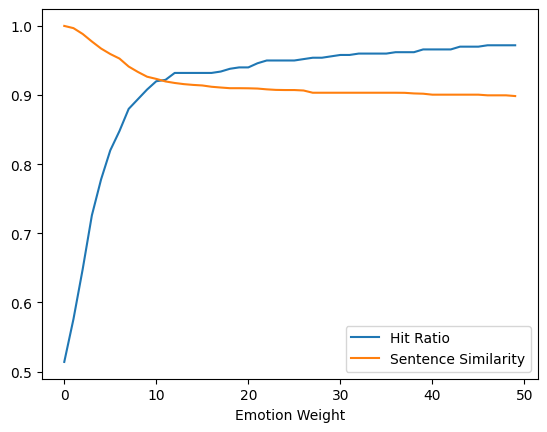

In [ ]:
# fig, ax = plt.subplots()
# ax.plot(e_r,color="red")
# ax2 = ax.twinx()
# ax2.plot(s_r, color="blue")
# plt.legend()
# plt.show()
# plt.plot(np.arange(1,50))
plt.plot(np.arange(0,50), e_r, s_r)
plt.legend(['Hit Ratio','Sentence Similarity'])
plt.xlabel('Emotion Weight')
# plt.ylim([0,1])
plt.show()

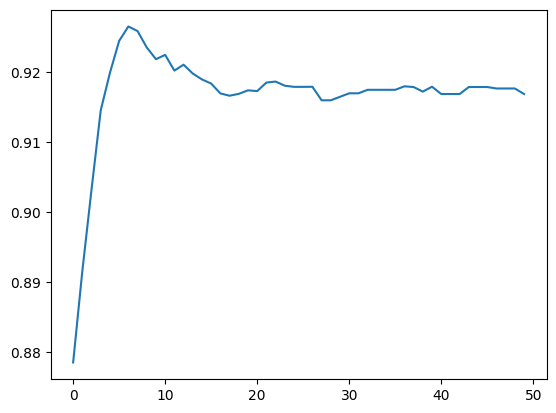

In [ ]:
plt.plot((e_r*1 + s_r*3) / 4)
plt.show()

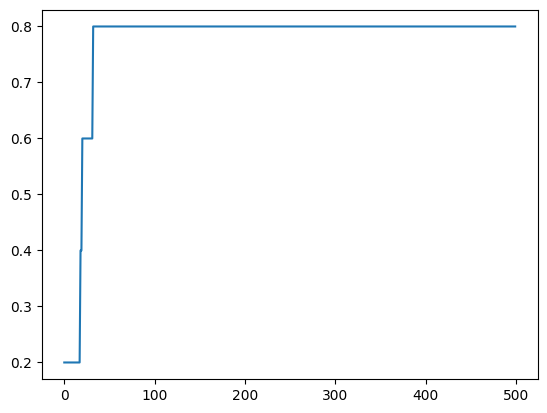

In [ ]:
import matplotlib.pyplot as plt
from tqdm import tqdm
x = np.arange(0,100)
plt.plot(emo_sen)#,marker = 'o')
plt.show()

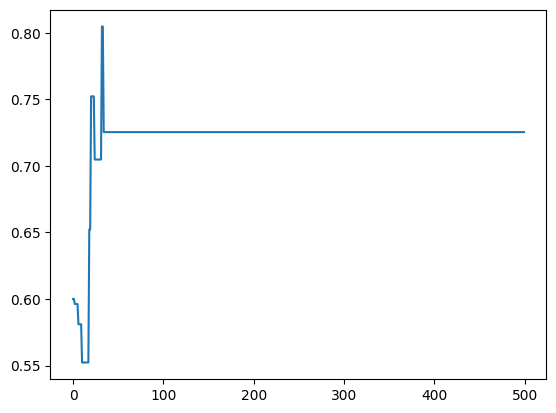

In [ ]:
plt.plot((emo_sen + sen )/2)#,marker = 'o')
plt.show()

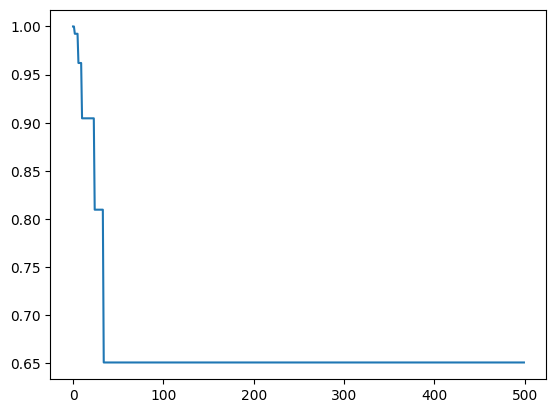

In [ ]:
plt.plot(sen)#,marker = 'o')
plt.show()


100%|██████████| 100/100 [00:18<00:00,  5.33it/s]


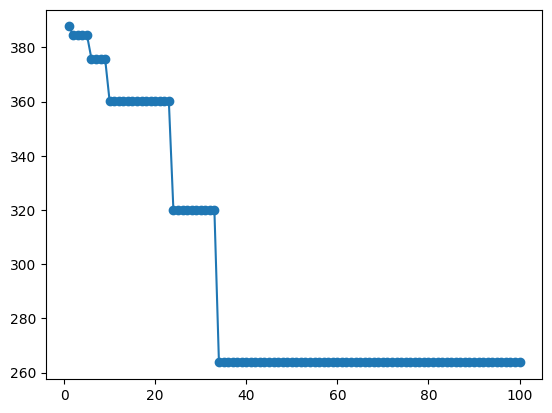

In [ ]:
import matplotlib.pyplot as plt
from tqdm import tqdm
# final.sentence_analysis(['귀여운 강아지'],1,5)
value = []
x = np.arange(1,101)
for i in tqdm(range(1,101)):
    value.append(final.sentence_analysis(['귀여운 강아지'],i,5))
plt.plot(x,np.array(value),marker = 'o')
plt.show()

In [ ]:
final.infer(final.train_sen[0])

tensor([[0.0762, 0.6678, 0.0560, 0.2000]], device='cuda:0',
       grad_fn=<SoftmaxBackward0>)

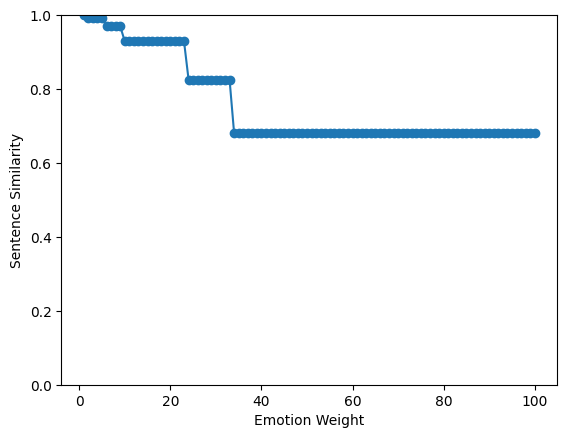

In [ ]:
standard = final.sentence_analysis(['귀여운 강아지'],0,5)
plt.plot(x, [v/standard for v in value],marker = 'o')
plt.xlabel("Emotion Weight")
plt.ylabel("Sentence Similarity")
plt.ylim([0,1])
plt.show()

In [ ]:
value

[387.72967529296875,
 384.76373291015625,
 384.76373291015625,
 384.76373291015625,
 384.76373291015625,
 375.89306640625,
 375.89306640625,
 375.89306640625,
 375.89306640625,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 360.1467590332031,
 320.0212707519531,
 320.0212707519531,
 320.0212707519531,
 320.0212707519531,
 320.0212707519531,
 320.0212707519531,
 320.0212707519531,
 320.0212707519531,
 320.0212707519531,
 320.0212707519531,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 263.7149658203125,
 26

In [ ]:
np.mean(final.add_emotion(np.array([1,1,1,1]), ['귀여운 강아지'], 0)[4:])
np.std(final.add_emotion(np.array([1,1,1,1]), ['귀여운 강아지'], 0)[4:])

0.03608431344934215

In [ ]:
a = final.sen_model.encode('귀여운 강아지')
print(a.shape)
# std = np.std(a,axis = 1).reshape(-1,1)
# mean = np.mean(a, axis = 1).reshape(-1,1)
# c = (a - mean) / std

# np.dot(c, final.train_vector[:,4:].T).shape

(768,)


In [ ]:
np.std(final.train_vector[:,4:],axis = 1)

array([0.99999276, 0.99999156, 0.99999363, 0.99999558, 0.99999604,
       0.99999891, 0.99999623, 0.99999797, 0.99999683, 0.9999925 ,
       0.99999953, 0.9999958 , 0.99999453, 0.99999516, 0.99999361,
       0.99999538, 0.99999315, 0.99999382, 0.99999019, 0.99998874,
       0.99999158, 0.99999547, 0.9999981 , 0.99999429, 0.99999494,
       0.99998882, 0.99999505, 0.99999752, 0.99999743, 0.99999587,
       0.99999615, 0.99999013, 0.99999684, 0.99999332, 0.99999492,
       0.99999713, 0.99999317, 0.99999431, 0.99999487, 0.99999964,
       0.99999147, 0.99999506, 0.99999524, 0.99999434, 0.9999958 ,
       0.99999618, 0.999997  , 0.99999899, 0.9999969 , 0.9999882 ,
       0.99999505, 0.99999386, 0.99999459, 0.9999949 , 0.99999654,
       0.99999722, 0.99999216, 0.99999357, 0.99999443, 0.99999537,
       0.99999049, 0.99999667, 0.99999817, 0.99999846, 0.99999434,
       0.99999455, 0.9999971 , 0.99999928, 0.99999615, 0.99999877,
       0.99999188, 0.99999449, 0.99999631, 0.99999327, 0.99999

In [ ]:
train_sentences, train_emotions, train_labels = load_dataset(emoticon_sentence_path)
train_sentences = convert_sentence_emotion(sentence_model, train_emotions, train_sentences)

In [ ]:
knn = KNeighborsClassifier(n_neighbors=3, algorithm='brute', metric='cosine')
knn.fit(train_sentences, train_labels)

KNeighborsClassifier(algorithm='brute', metric='cosine', n_neighbors=3)

In [ ]:
input_sentence = ['오늘 아침이 좀 개운한데?']

In [ ]:
sentence_emotion = infer(emotion_model, input_sentence)
sentence_emotion = np.argmax(sentence_emotion.cpu().detach())
sentence_emotion

tensor(2)

In [ ]:
sentence_vector = add_emotion(sentence_model, int(sentence_emotion), input_sentence)

In [ ]:
emoticon_idx = knn.predict([sentence_vector])

In [ ]:
print('Recommended emoticon: ' + idx2emoticon[int(emoticon_idx)])

Recommended emoticon: ⸜(*ˊᗜˋ*)⸝


In [ ]:
def recommend(knn, input_sentence, num_recommend,weight_emotion = 1):
    sentence_emotion = infer(emotion_model, input_sentence)
    sentence_emotion = sentence_emotion.cpu().detach().numpy()

    sentence_vector = add_emotion(sentence_model, sentence_emotion * weight_emotion, input_sentence)
    print(sentence_emotion)
    sentence_emotion = np.argmax(sentence_emotion)
    recommend_num = num_recommend
    selected = {idx : i for idx, i in enumerate(knn.predict_proba([sentence_vector]).reshape(-1)) if i!=0}
    sorted_dict = sorted(selected.items(), key = lambda item: item[1], reverse = True)
    loss = 0
    for idx, i in enumerate(sorted_dict):
        if idx >= recommend_num : break
        print('Rank{} recommended emoticon: {}'.format(idx+1, idx2emoticon[int(i[0])]))
        vote = np.array([0,0,0,0])
        for v in [train_emotions[j] for j in np.where(train_labels == i[0])[0]]:
            vote[v] +=1
        record = np.argmax(vote)
        if record != sentence_emotion : loss += 1

    if idx < recommend_num:
        print("Please train model with larger neighbors")
    else:
        print("Accuracy: ", (recommend_num - loss) / recommend_num)

In [ ]:
def add_emotion(model, emotion, sentence):

    sentence = model.encode(sentence)

    distance = np.sqrt(np.mean(sentence**2))

    emo_added = np.array([0, 0, 0, 0])
    emo_added = np.append(emotion, sentence)

    # emo_added[emotion] = distance

    return emo_added

In [ ]:
knn = KNeighborsClassifier(n_neighbors=25, algorithm='brute', metric='cosine')
knn.fit(train_sentences, train_labels)
recommend(knn = knn, input_sentence = input_sentence, num_recommend = 5, weight_emotion = 768/4)

[[0.03736219 0.02495655 0.91990095 0.01778034]]
Rank1 recommended emoticon: ( *˘╰╯˘*)
Rank2 recommended emoticon: ୧〳 ” ʘ̆ ᗜ ʘ̆ ” 〵୨
Rank3 recommended emoticon: ( ⁎ ᵕᴗᵕ ⁎ )
Rank4 recommended emoticon: ✧*.◟(ˊᗨˋ)◞.*✧
Rank5 recommended emoticon: ⸜(*ˊᗜˋ*)⸝
Accuracy:  1.0


In [ ]:
len(train_sentences)

[array([ 0.00000000e+00,  0.00000000e+00,  6.53919458e-01,  0.00000000e+00,
        -1.21336699e-01, -2.41991132e-01,  9.57825333e-02, -6.26011252e-01,
         6.32331252e-01,  6.96152091e-01,  8.73627424e-01, -3.47709417e-01,
        -7.48628750e-02,  4.01330769e-01, -3.54542702e-01,  7.51536250e-01,
         2.75626242e-01, -4.83245611e-01, -1.31524050e+00, -5.18178880e-01,
        -4.57604527e-01,  3.25960040e-01, -1.41814637e+00,  7.50915527e-01,
        -4.53119099e-01, -5.95601082e-01, -3.34393650e-01,  6.58017278e-01,
        -7.25198030e-01,  5.23550034e-01, -2.93791443e-01, -7.83204883e-02,
        -4.76253927e-01, -1.50743473e+00, -4.18967791e-02, -9.97975647e-01,
        -1.48734480e-01, -1.84662059e-01,  5.94461679e-01,  8.00889015e-01,
        -8.27202320e-01,  2.42975026e-01,  5.10914445e-01,  3.70407432e-01,
        -3.73280287e-01,  7.63595402e-01, -3.88653636e-01,  1.63801402e-01,
        -1.11967757e-01, -6.27342641e-01,  7.63822570e-02,  4.36008990e-01,
         3.6